In [63]:
import pandas as pd
from datetime import datetime as dt

import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import re

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

import requests
import time
from os import listdir

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

import numpy as np



In [28]:
def do_basic_cleanup(df, drop_cols):
    df = df.rename(columns={c: c.lower().replace(" ", "_").replace("(", "").replace(")", "") for c in df.columns})
    try:
      df = df.drop(columns=drop_cols)
    except Exception as e:
      print(e)
    return df


def get_df_from_dir(dir_name, cols_to_drop=[]):
    df = pd.DataFrame()
    for file in listdir(dir_name):
      try:
          df_part = pd.read_csv(f"{dir_name}/" + file, on_bad_lines='warn')
          df_part = do_basic_cleanup(df_part, cols_to_drop)
          if 'ticker' not in df_part.columns:
            ticker = file.split('.')[0]
            df_part['ticker'] = [ticker for i in range(0, df_part.shape[0])]
          print(file, df_part.shape)
          df = pd.concat([df, df_part], ignore_index=True)
      except Exception as e:
         print(e)
    return df

def filter_df(df, item, metric, area, year=0):
    return df[(df.value > 0.0) & (df.item == item) & (df.element == metric) & (df.area == area) & (df.year >= year)]

In [29]:
sentiment_df = get_df_from_dir('data/stock-tweet-and-price/stocktweet', ['id'])
sentiment_df.head()

stocktweet.csv (10000, 3)


,date,ticker,tweet
0,01/01/2020,AMZN,$AMZN Dow futures up by 100 points already 🥳
1,01/01/2020,TSLA,$TSLA Daddy's drinkin' eArly tonight! Here's t...
2,01/01/2020,AAPL,$AAPL We’ll been riding since last December fr...
3,01/01/2020,TSLA,"$TSLA happy new year, 2020, everyone🍷🎉🙏"
4,01/01/2020,TSLA,"$TSLA haha just a collection of greats...""Mars..."


In [30]:
sentiment_df.shape

(10000, 3)

In [31]:
stocks_df = get_df_from_dir('data/stock-tweet-and-price/stockprice')
print(stocks_df.head())
print(stocks_df.tail())

BA.csv (254, 8)
TM.csv (254, 8)
V.csv (254, 8)
BAC.csv (254, 8)
LOW.csv (254, 8)
BKNG.csv (254, 8)
TSM.csv (254, 8)
ABNB.csv (15, 8)
SBUX.csv (254, 8)
AMT.csv (254, 8)
PG.csv (254, 8)
MCD.csv (254, 8)
AMZN.csv (254, 8)
KO.csv (254, 8)
PYPL.csv (254, 8)
UPS.csv (254, 8)
MSFT.csv (254, 8)
CCL.csv (254, 8)
NVDA.csv (254, 8)
HD.csv (254, 8)
XOM.csv (254, 8)
CVX.csv (254, 8)
NKE.csv (254, 8)
FB.csv (254, 8)
DIS.csv (254, 8)
NFLX.csv (254, 8)
JPM.csv (254, 8)
TSLA.csv (254, 8)
GOOGL.csv (254, 8)
META.csv (254, 8)
GOOG.csv (254, 8)
GSPC.csv (254, 8)
PFE.csv (254, 8)
BABA.csv (254, 8)
UNH.csv (254, 8)
MA.csv (254, 8)
BRK-A.csv (254, 8)
AAPL.csv (254, 8)
WMT.csv (254, 8)
BRK-B.csv (254, 8)
JNJ.csv (254, 8)
         date        open        high         low       close   adj_close  \
0  2019-12-31  325.410004  326.570007  323.320007  325.760010  323.833313   
1  2020-01-02  328.549988  333.350006  327.700012  333.320007  331.348572   
2  2020-01-03  330.630005  334.890015  330.299988  332.760010 

In [32]:
# Remove entries with empty values
sentiment_df = sentiment_df.dropna()

# Convert the 'date' column in sentiment_df to the format YYYY-MM-DD
sentiment_df['date'] = pd.to_datetime(sentiment_df['date'], format='%d/%m/%Y').dt.strftime('%Y-%m-%d')
print(sentiment_df['date'].to_list())


['2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-06', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-07', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020-01-08', '2020

In [33]:
stocks_df.head()

,date,open,high,low,close,adj_close,volume,ticker
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA


In [34]:
sentiment_df.head()

,date,ticker,tweet
0,2020-01-01,AMZN,$AMZN Dow futures up by 100 points already 🥳
1,2020-01-01,TSLA,$TSLA Daddy's drinkin' eArly tonight! Here's t...
2,2020-01-01,AAPL,$AAPL We’ll been riding since last December fr...
3,2020-01-01,TSLA,"$TSLA happy new year, 2020, everyone🍷🎉🙏"
4,2020-01-01,TSLA,"$TSLA haha just a collection of greats...""Mars..."


In [36]:
# Merge sentiment_df with stocks_df on both 'ticker' and 'date' columns
merged_df = pd.merge(stocks_df, sentiment_df, on=['ticker', 'date'])

merged_df.shape

(9619, 9)

In [37]:
# Display the merged DataFrame
merged_df.head()

,date,open,high,low,close,adj_close,volume,ticker,tweet
0,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,$BA Stocks usually look bearish until they do...
1,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,$BA heh. Would you look at that future 🤨 good ...
2,2020-01-08,332.399994,334.029999,329.600006,331.369995,329.410095,8239200,BA,$BA Of course there were technical problems be...
3,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,$BA BOEING is a bear proof stock. 😂
4,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,$BA new CEO already cleaning out the dirty lau...


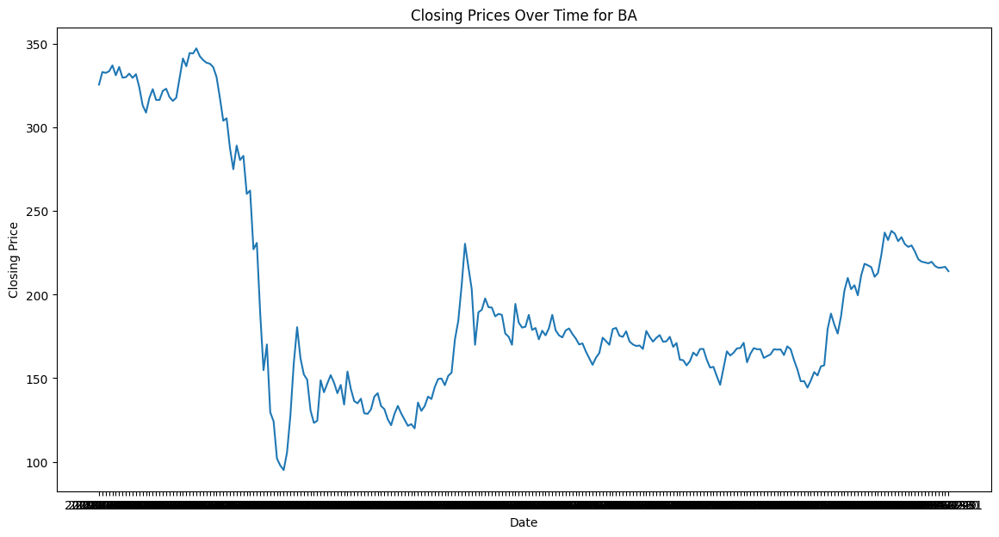

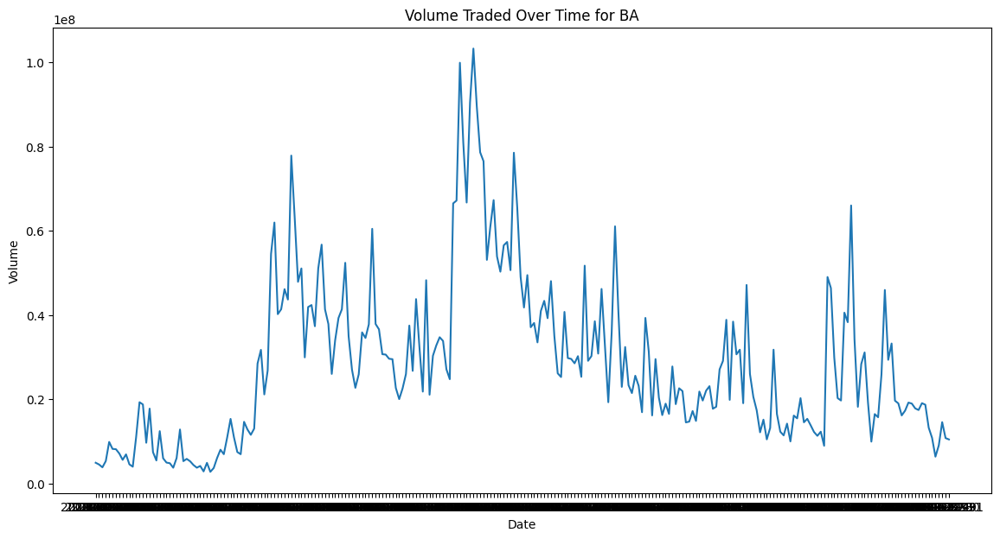

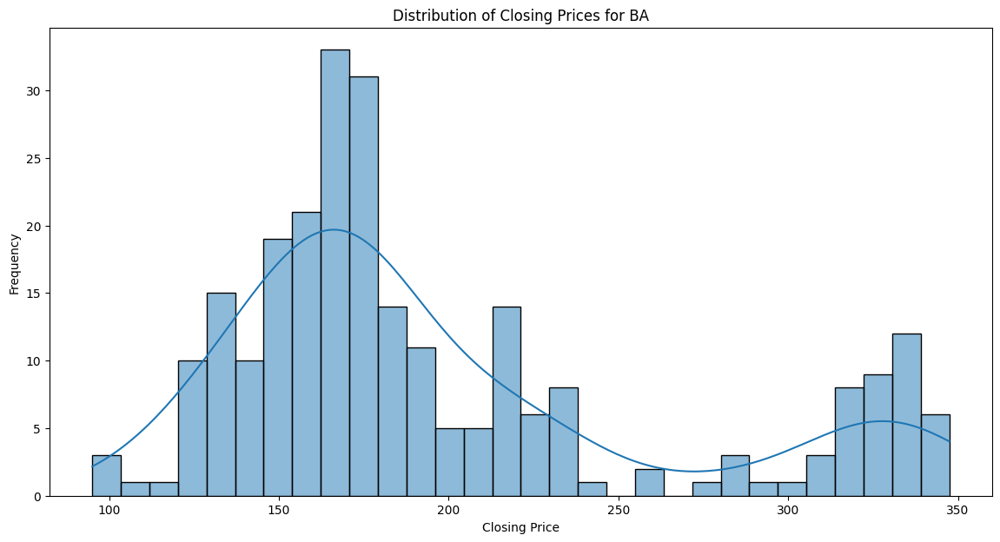

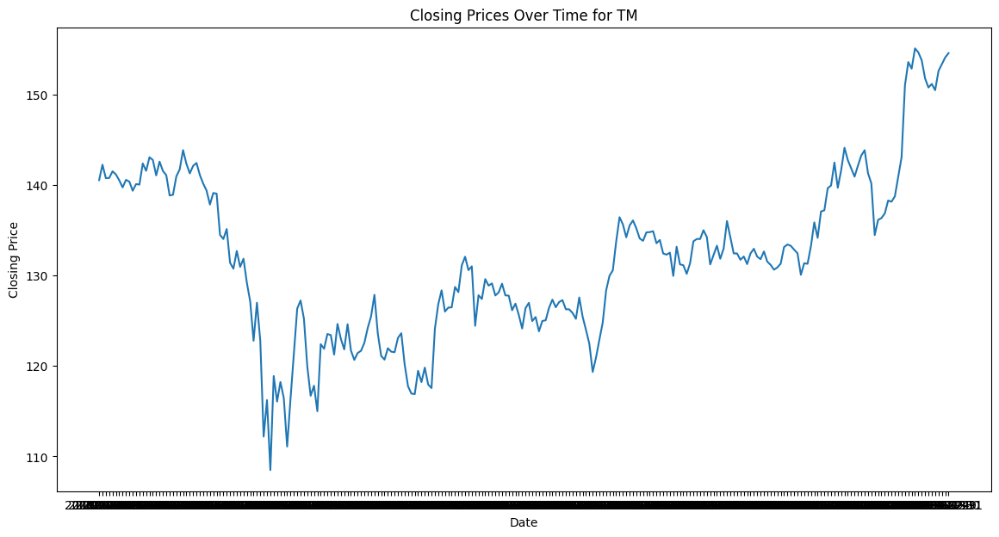

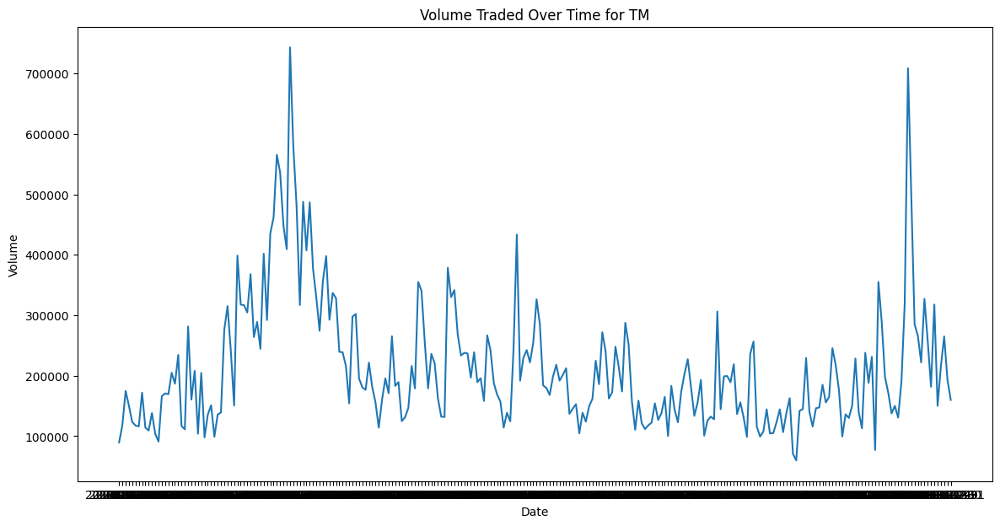

...

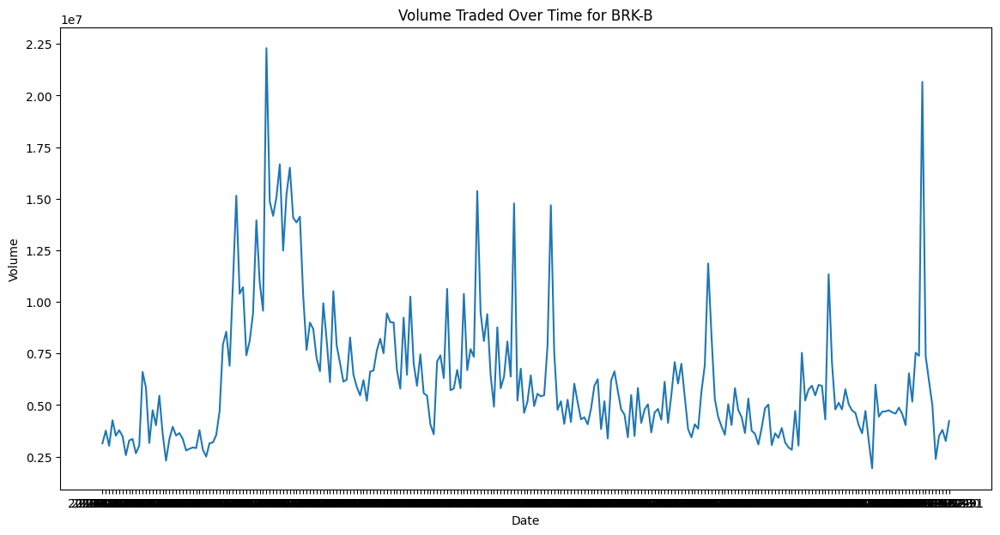

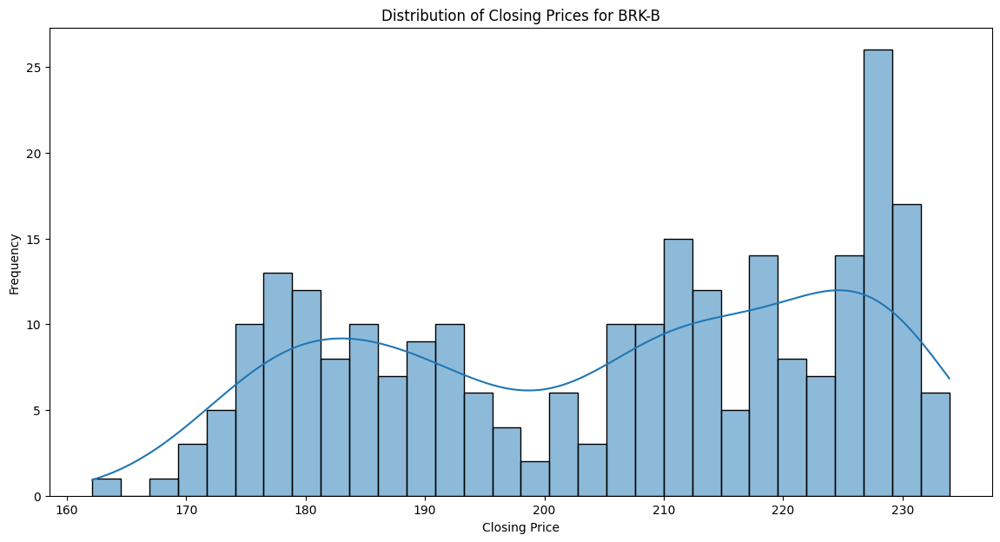

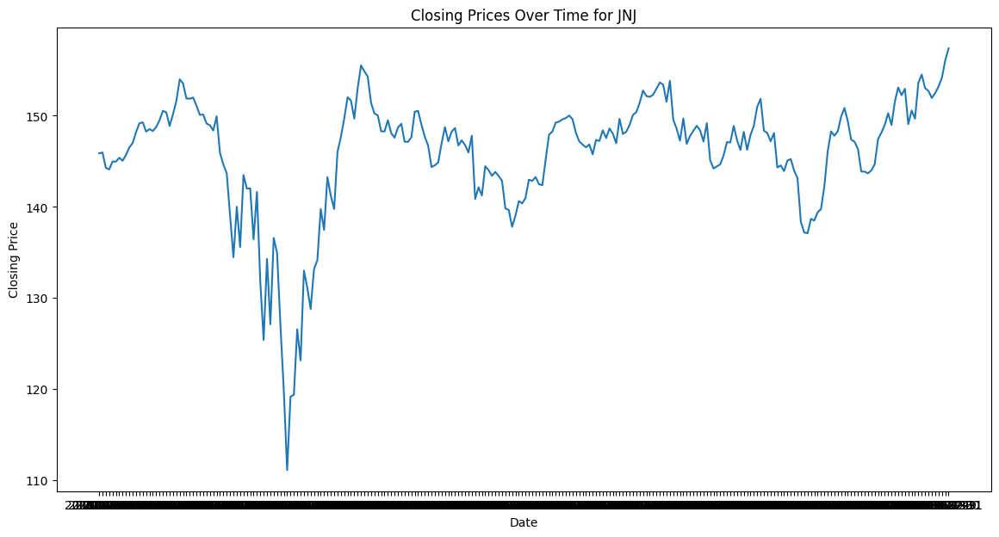

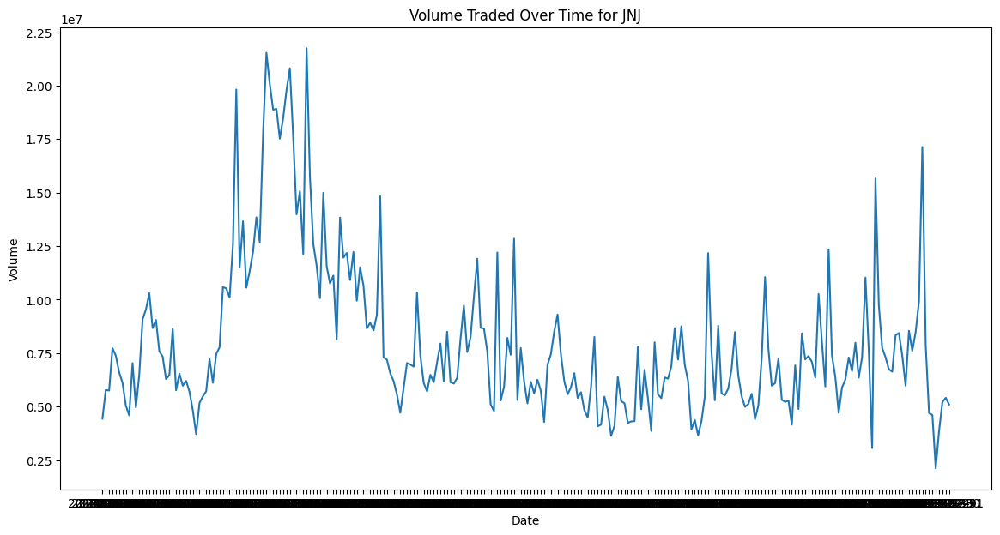

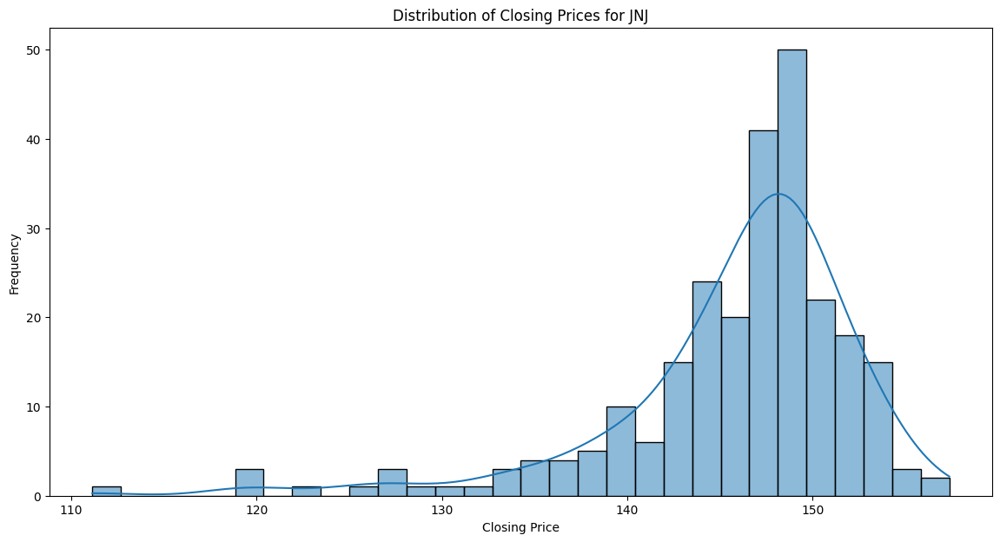

In [40]:

# Extract unique tickers
tickers = stocks_df['ticker'].unique()

# Loop through each ticker and generate plots
for ticker in tickers:
    ticker_df = stocks_df[stocks_df['ticker'] == ticker]
    
    # Plot the closing prices over time
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=ticker_df, x='date', y='close')
    plt.title(f'Closing Prices Over Time for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.show()

    # Plot the volume traded over time
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=ticker_df, x='date', y='volume')
    plt.title(f'Volume Traded Over Time for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.show()

    # Plot the distribution of closing prices
    plt.figure(figsize=(14, 7))
    sns.histplot(data=ticker_df, x='close', kde=True, bins=30)
    plt.title(f'Distribution of Closing Prices for {ticker}')
    plt.xlabel('Closing Price')
    plt.ylabel('Frequency')
    plt.show()

In [41]:
from sklearn.model_selection import TimeSeriesSplit

def plot_timeseries_split(X, y, n_splits=3):
    folds = TimeSeriesSplit(n_splits=n_splits)

    f, ax = plt.subplots(nrows=n_splits, ncols=2, figsize=(16, 9))
    
    for i, (train_index, valid_index) in enumerate(folds.split(X)):
        X_train, X_valid = X[train_index], X[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
    
        _ = sns.lineplot(
            x=X_train, 
            y=y_train, 
            ax=ax[i,0], 
            color='dodgerblue', 
            label='train'
        )
        _ = sns.lineplot(
            x=X_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
            y=y_train[len(X_train) - len(X_valid):(len(X_train) - len(X_valid) + len(X_valid))], 
            ax=ax[i,1], 
            color='dodgerblue', 
            label='train'
        )
    
        for j in range(2):
            sns.lineplot(x= X_valid, y= y_valid, ax=ax[i, j], color='darkorange', label='validation')
        ax[i, 0].set_title(f"Rolling Window with Adjusting Training Size (Split {i+1})", fontsize=16);
        ax[i, 1].set_title(f"Rolling Window with Constant Training Size (Split {i+1})", fontsize=16);
    
    for i in range(n_splits):
        ax[i, 0].set_xlim([1961, 2024]);
        ax[i, 1].set_xlim([1961, 2024]);
        
    plt.tight_layout()
    plt.show()

plot_timeseries_split(X, y)

## Vader sentiment analysis

In [48]:
# Documentation https://www.nltk.org/_modules/nltk/sentiment/vader.html
# DO NOT FORGET TO CITE THIS in the REPORT!!!
# https://github.com/cjhutto/vaderSentiment?tab=readme-ov-file#citation-information

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to apply VADER and return sentiment scores
def get_vader_scores(text):
    scores = analyzer.polarity_scores(text)
    return pd.Series([scores['neg'], scores['neu'], scores['pos'], scores['compound']])

# Assuming 'text_column' is the column in merged_df containing the text data
# Apply the function to the text column and create new columns for the sentiment scores
merged_df[['neg', 'neu', 'pos', 'compound']] = merged_df['tweet'].apply(get_vader_scores)

# Display the updated DataFrame
merged_df.head()

,date,open,high,low,close,adj_close,volume,ticker,tweet,neg,neu,pos,compound
0,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,$BA Stocks usually look bearish until they do...,0.000,0.797,0.203,0.4215
1,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,$BA heh. Would you look at that future 🤨 good ...,0.086,0.757,0.157,0.3182
2,2020-01-08,332.399994,334.029999,329.600006,331.369995,329.410095,8239200,BA,$BA Of course there were technical problems be...,0.286,0.578,0.136,-0.7177
3,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,$BA BOEING is a bear proof stock. 😂,0.000,1.000,0.000,0.0000
4,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,$BA new CEO already cleaning out the dirty lau...,0.244,0.756,0.000,-0.4404


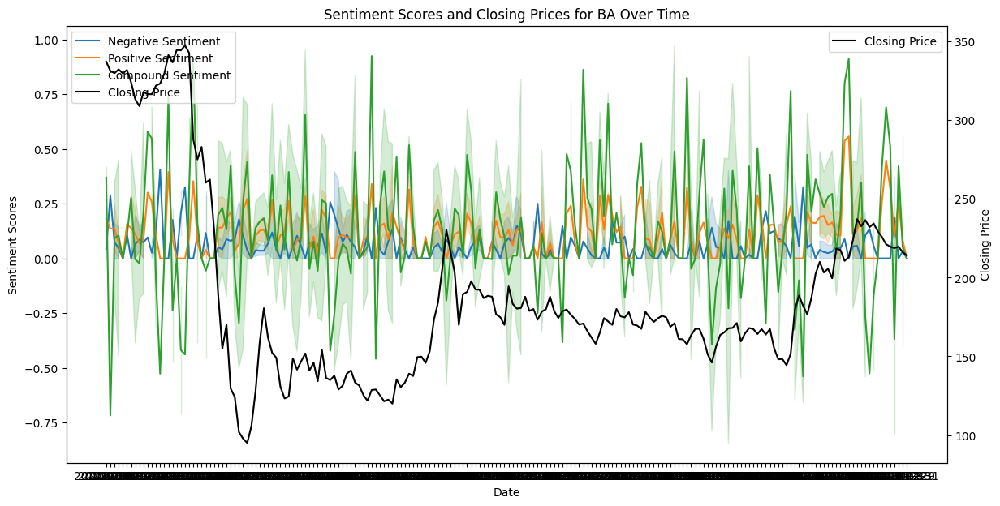

In [52]:
# Filter the DataFrame for ticker 'BA'
ba_df = merged_df[merged_df['ticker'] == 'BA']

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot sentiment scores on the primary y-axis
sns.lineplot(data=ba_df, x='date', y='neg', label='Negative Sentiment', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='pos', label='Positive Sentiment', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='compound', label='Compound Sentiment', ax=ax1)

# Create a secondary y-axis
ax2 = ax1.twinx()

# Plot closing prices on the secondary y-axis
sns.lineplot(data=ba_df, x='date', y='close', label='Closing Price', ax=ax2, color='black')

# Set titles and labels
ax1.set_title('Sentiment Scores and Closing Prices for BA Over Time')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Scores')
ax2.set_ylabel('Closing Price')

# Combine legends from both y-axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()

In [54]:
ba_df.columns

Index(['date', 'open', 'high', 'low', 'close', 'adj_close', 'volume', 'ticker',
       'tweet', 'neg', 'neu', 'pos', 'compound'],
      dtype='object')

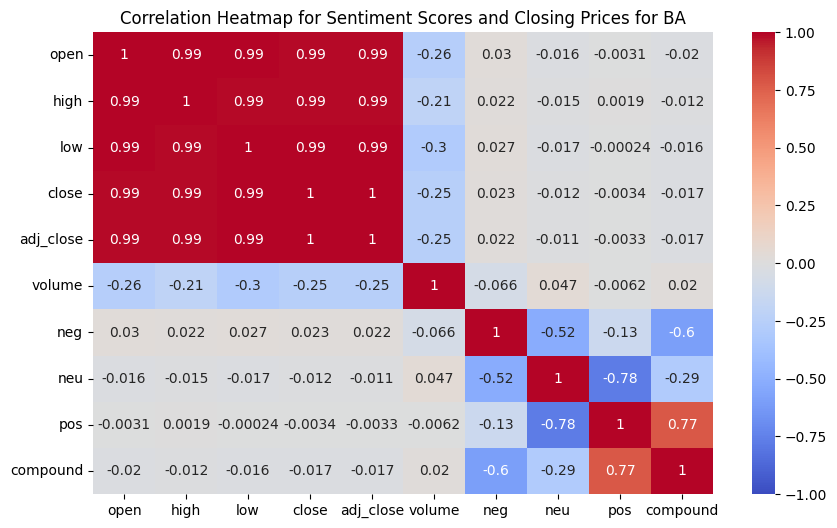

In [55]:
# Select relevant columns for the heatmap
heatmap_data = ba_df[['open', 'high', 'low', 'close', 'adj_close', 'volume', 'neg', 'neu', 'pos', 'compound']]

# Create a correlation matrix
corr_matrix = heatmap_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap for Sentiment Scores and Closing Prices for BA')
plt.show()

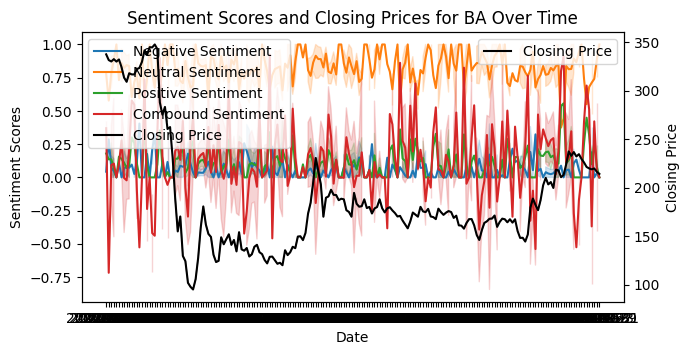

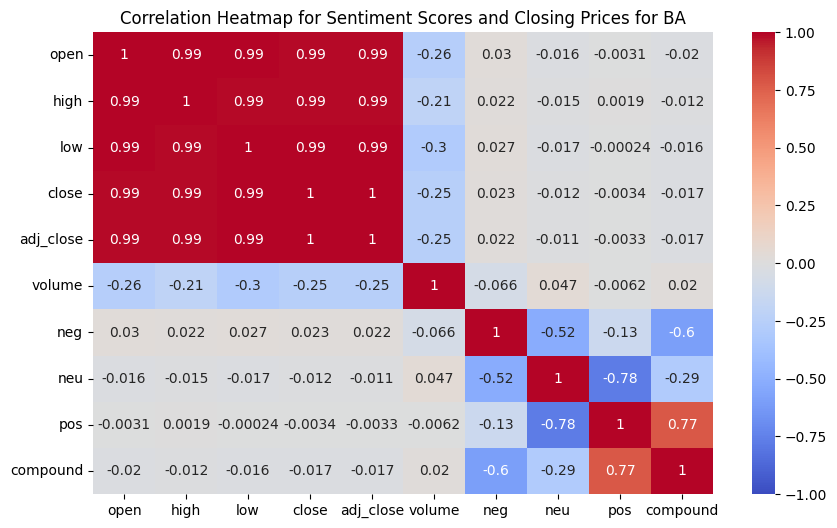

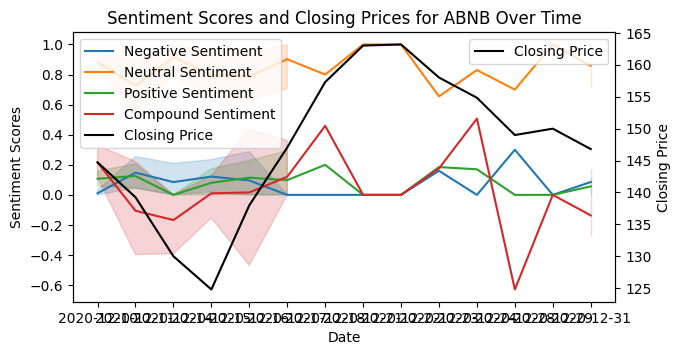

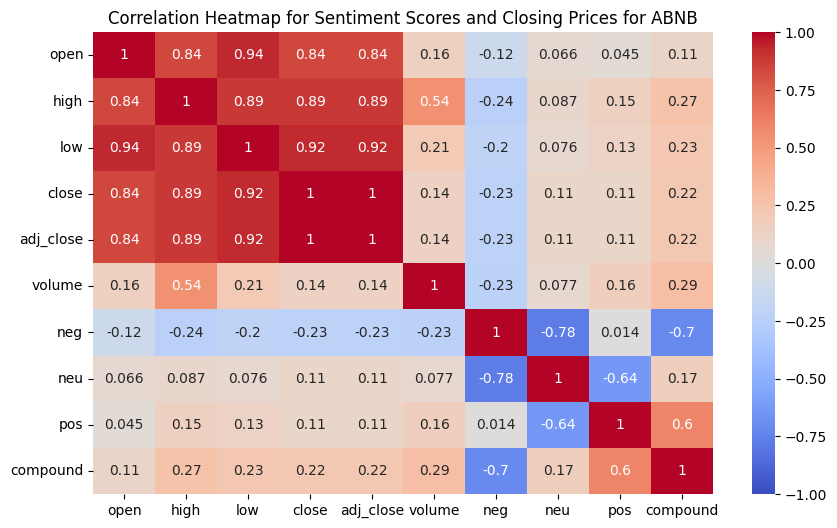

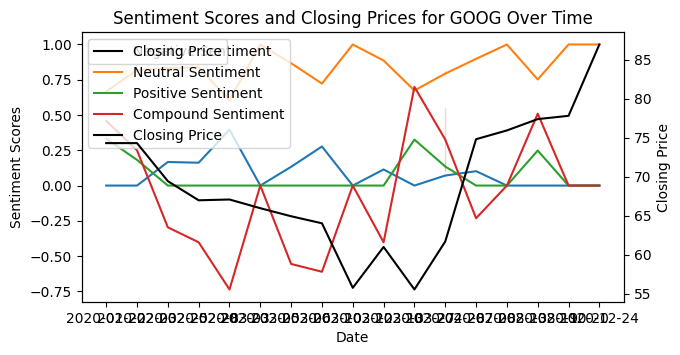

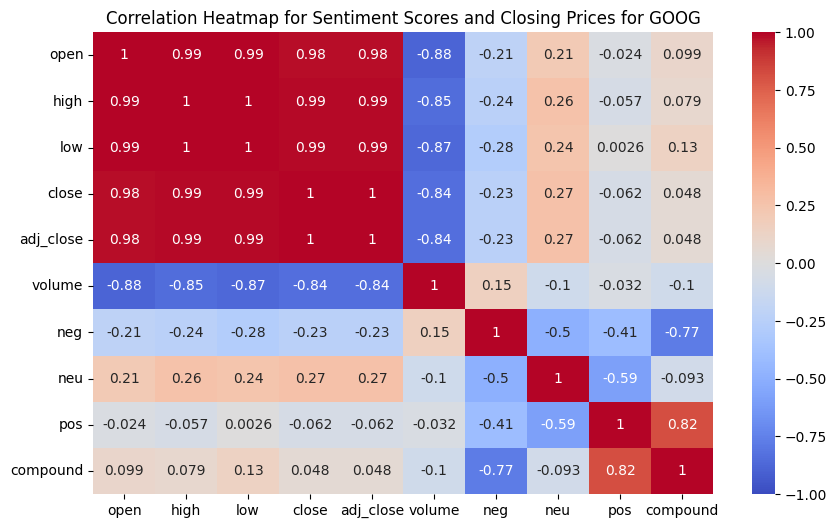

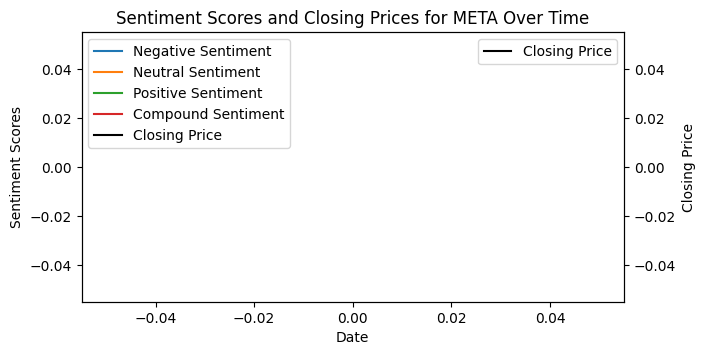

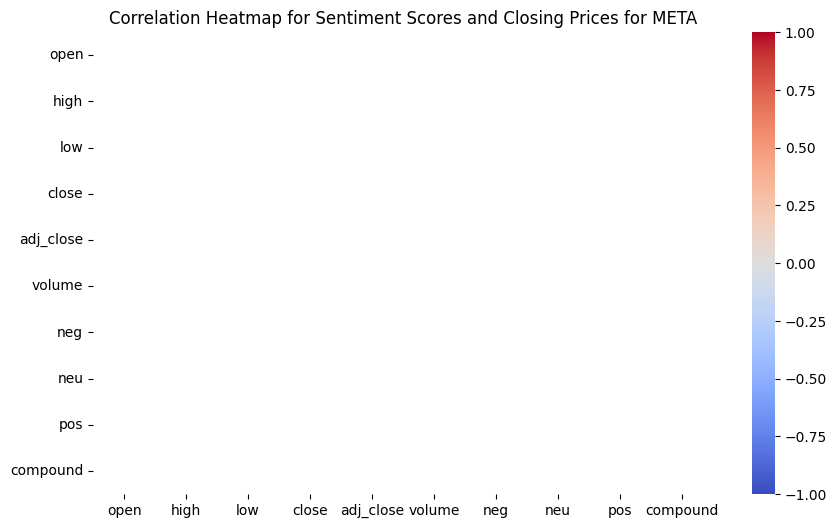

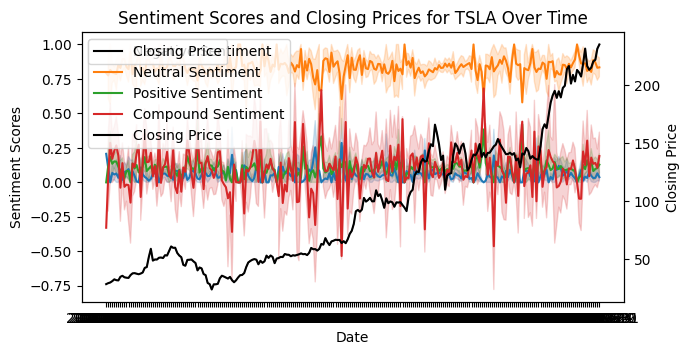

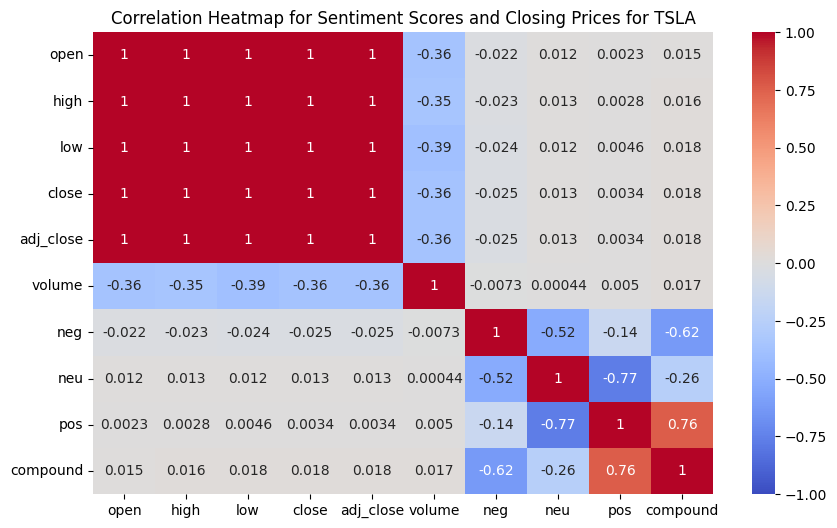

In [58]:
# List of tickers to plot
tickers = ['BA', 'ABNB', 'GOOG', 'META', 'TSLA']

for ticker in tickers:
    # Filter the DataFrame for the current ticker
    ticker_df = merged_df[merged_df['ticker'] == ticker]
    
    # Create line plots for sentiment scores and closing prices
    fig, ax1 = plt.subplots(figsize=(7, 3.5))  # Adjusted size
    
    sns.lineplot(data=ticker_df, x='date', y='neg', label='Negative Sentiment', ax=ax1)
    sns.lineplot(data=ticker_df, x='date', y='neu', label='Neutral Sentiment', ax=ax1)
    sns.lineplot(data=ticker_df, x='date', y='pos', label='Positive Sentiment', ax=ax1)
    sns.lineplot(data=ticker_df, x='date', y='compound', label='Compound Sentiment', ax=ax1)
    
    ax2 = ax1.twinx()
    sns.lineplot(data=ticker_df, x='date', y='close', label='Closing Price', ax=ax2, color='black')
    
    ax1.set_title(f'Sentiment Scores and Closing Prices for {ticker} Over Time')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Sentiment Scores')
    ax2.set_ylabel('Closing Price')
    
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')
    
    plt.show()
    
    # Create heatmap for sentiment scores and closing prices
    heatmap_data = ticker_df[['open', 'high', 'low', 'close', 'adj_close', 'volume', 'neg', 'neu', 'pos', 'compound']]
    corr_matrix = heatmap_data.corr()
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f'Correlation Heatmap for Sentiment Scores and Closing Prices for {ticker}')
    plt.show()

In [60]:
merged_df.to_csv('data/processed_df.csv', index=False)


## Store preprosessed data in MongoDB

In [ ]:
import pymongo
from pymongo import MongoClient

# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # MongoDB connection string
db = client['stocks']  # database name
collection = db['PROCESSED_DB']  # collection name

# Convert DataFrame to dictionary
data_dict = merged_df.to_dict("records")

# Insert data into MongoDB
collection.insert_many(data_dict)

print("Data inserted successfully!")

## Time Series Analysis

Epoch 1/20
105/105 [==============================] - 6s 9ms/step - loss: 0.0109
Epoch 2/20
105/105 [==============================] - 1s 9ms/step - loss: 1.4176e-04
Epoch 3/20
105/105 [==============================] - 1s 10ms/step - loss: 1.2168e-04
Epoch 4/20
105/105 [==============================] - 1s 11ms/step - loss: 1.1478e-04
Epoch 5/20
105/105 [==============================] - 1s 9ms/step - loss: 1.1230e-04
Epoch 6/20
105/105 [==============================] - 1s 9ms/step - loss: 1.1652e-04
Epoch 7/20
105/105 [==============================] - 1s 10ms/step - loss: 1.1254e-04
Epoch 8/20
105/105 [==============================] - 1s 9ms/step - loss: 1.1892e-04
Epoch 9/20
105/105 [==============================] - 1s 9ms/step - loss: 1.1279e-04
Epoch 10/20
105/105 [==============================] - 1s 9ms/step - loss: 1.1461e-04
Epoch 11/20
105/105 [==============================] - 1s 12ms/step - loss: 1.1734e-04
Epoch 12/20
105/105 [==============================] - 1s 14ms/

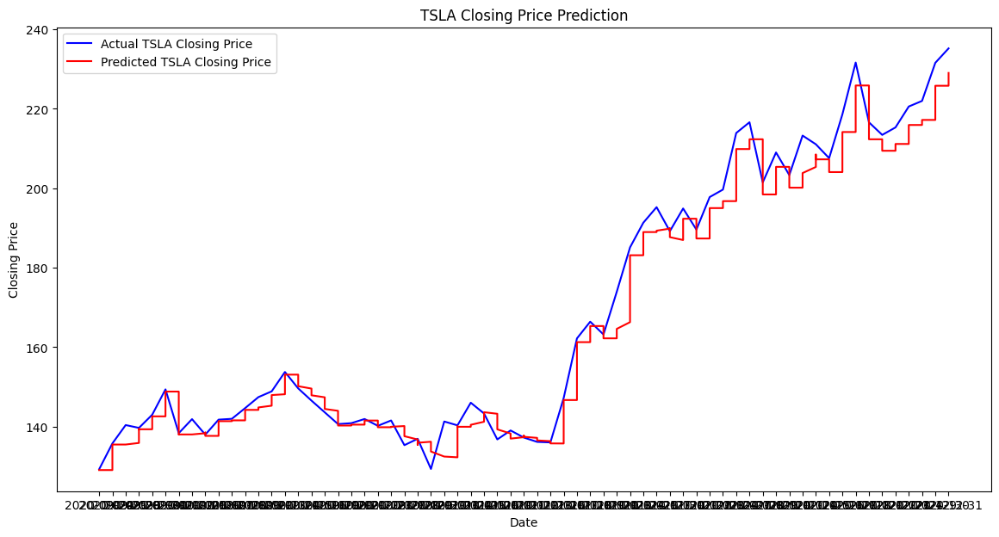

In [65]:
# Filter the DataFrame for ticker 'TSLA'
tsla_df = merged_df[merged_df['ticker'] == 'TSLA']

# Sort by date
tsla_df = tsla_df.sort_values('date')

# Use only the 'close' column for prediction
data = tsla_df[['close']].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Create sequences of data
def create_sequences(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 7  # Use the past 60 days to predict the next day's closing price
X, y = create_sequences(scaled_data, seq_length)

# Split the data into training and testing sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

# Build the RNN model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(seq_length, 1)))
model.add(LSTM(units=50))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Make predictions
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions)

# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(tsla_df['date'][split + seq_length:], data[split + seq_length:], color='blue', label='Actual TSLA Closing Price')
plt.plot(tsla_df['date'][split + seq_length:], predictions, color='red', label='Predicted TSLA Closing Price')
plt.title('TSLA Closing Price Prediction')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

In [66]:
import plotly.graph_objects as go

# Create the Plotly figure
fig = go.Figure()

# Add the actual closing price trace
fig.add_trace(go.Scatter(
    x=tsla_df['date'][split + seq_length:],
    y=data[split + seq_length:].flatten(),
    mode='lines',
    name='Actual TSLA Closing Price',
    line=dict(color='blue')
))

# Add the predicted closing price trace
fig.add_trace(go.Scatter(
    x=tsla_df['date'][split + seq_length:],
    y=predictions.flatten(),
    mode='lines',
    name='Predicted TSLA Closing Price',
    line=dict(color='red')
))

# Update the layout
fig.update_layout(
    title='TSLA Closing Price Prediction',
    xaxis_title='Date',
    yaxis_title='Closing Price',
    legend=dict(x=0, y=1)
)

# Show the figure
fig.show()